# UFABC - ESTI019 - Codificação de Sinais Multimídia
<h2> Laboratório 6 - PDS da Voz </h2>
<h3> Prof. Mário Minami </h2>
<h2> OBJETIVOS: </h2>
<ol>
<li> Gravar Arquivos de Áudio com dígitos, números gerais, texto lido e poesia </li>
<li> Leitura de Arquivos de Áudio e janelamento</li>
<li> Cálculo das Energias de Tempo Curto</li>
<li> Cálculo dos Espectrogramas</li>
<li> Determinação do Pitch, da Frequência Fundamental e das Formantes ($f_1$ a $f_4$) de Algumas Vogais</li>
<li>Determinação de fonemas surdos, sonoros, consoantes gerais e plosivos</li>
</ol>

<h2> 1. Gravar Arquivos de Áudio com dígitos, números gerais, texto lido e poesia </h2>

Usando o Audacity, ou outro programa de áudio, grave arquivos com:
<ul>
<li> Dígitos (pronunciados separadamente) </li>
<li> Números Gerais (p.ex. dia/mês/ano de nascimento, nº celular, RA)</li>
<li> Texto lido </li>
<li> Poesia declamada </li>
</ul>


# DICAS: 
1.   *Ajuste antes o nível do volume do microfone, para uma boa faixa dinâmica, evitando saturar as gravações;*
2.   *Para os dígitos isolados, cuide da pausa entre eles, pelo menos uns 100 ms entre um e outro, o que não precisa ocorrer nos números gerais;*
3. *Treinar a leitura antes, tanto do texto quanto da poesia, para obter boas gravações.* 
 




<h2> 2. Leitura de Arquivos de Áudio e janelamento </h2>

In [1]:
from pathlib import Path
'''import shutil

dirGit = Path('/content/dwm-multimidia.github.io/')
if dirGit.exists():
  shutil.rmtree(dirGit)

!git clone https://github.com/dwm-multimidia/dwm-multimidia.github.io.git

dirLab6 = dirGit.joinpath('lab6/jupyter/')
print('\nAgora temos acesso aos arquivos:\n\t', '\n\t '.join([str(arquivo) for arquivo in dirLab6.iterdir()]))
'''
dirLab6 = Path('.')

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
import IPython.display
from scipy import signal
import matplotlib.pyplot as plt
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter, AutoMinorLocator)

In [4]:
#OBS.: insira nome do arquivo WAV
audio1 = dirLab6 /'Entre_Leva_Catia_Falada.wav'
print(f'Arquivo: {audio1}')
v1 , sr1 = librosa.load(audio1)
IPython.display.Audio(data=v1, rate=sr1)

Arquivo: Entre_Leva_Catia_Falada.wav


In [5]:
def input_data(filename):
    v1, sr1 = librosa.load(dirLab6 / f'{filename}.wav')
    return filename, v1, sr1

In [6]:
dimitri1 = input_data('dimitri1')
dimitri2 = input_data('dimitri2')
dimitri3 = input_data('dimitri3')
dimitri4 = input_data('dimitri4')

matheus1 = input_data('matheus1')
matheus2 = input_data('matheus2')
matheus3 = input_data('matheus3')
matheus4 = input_data('matheus4')

william1 = input_data('william1')
william2 = input_data('william2')
william3 = input_data('william3')
william4 = input_data('william4')

In [7]:
def audio_info(nome, v1, sr1):
    print(f'Arquivo: {nome}.wav')
    print(f'n_samples: {v1.shape}\nSampling rate: {sr1}')

In [8]:
arquivo = dimitri1
audio_info(arquivo[0], arquivo[1], arquivo[2])
IPython.display.Audio(data=arquivo[1], rate=arquivo[2])

Arquivo: dimitri1.wav
n_samples: (282112,)
Sampling rate: 22050


In [9]:
arquivo = matheus2
audio_info(arquivo[0], arquivo[1], arquivo[2])
IPython.display.Audio(data=arquivo[1], rate=arquivo[2])

Arquivo: matheus2.wav
n_samples: (95744,)
Sampling rate: 22050


In [10]:
arquivo = william3
audio_info(arquivo[0], arquivo[1], arquivo[2])
IPython.display.Audio(data=arquivo[1], rate=arquivo[2])

Arquivo: william3.wav
n_samples: (667136,)
Sampling rate: 22050


In [11]:
def plotSinalTempo(nome, audio, v1, sr1):
    #plt.figure()
    fig, ax = plt.subplots(figsize=(12, 3))
    librosa.display.waveplot(v1, sr=sr1)
    plt.title(f'Voz de {nome} - ' + str(audio))
    plt.show()

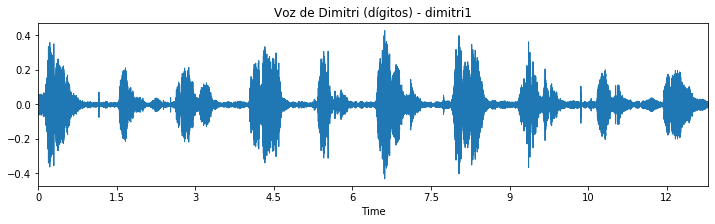

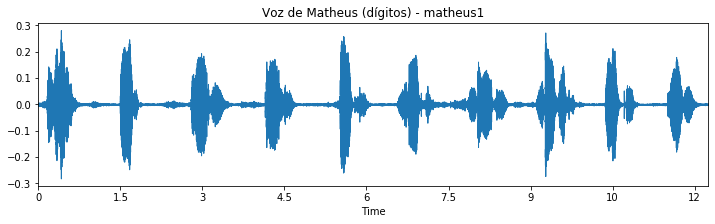

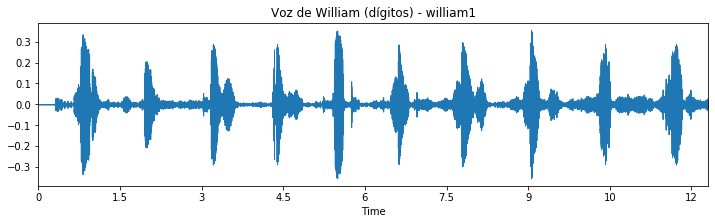

In [12]:
plotSinalTempo('Dimitri (dígitos)', dimitri1[0], dimitri1[1], dimitri1[2])
plotSinalTempo('Matheus (dígitos)', matheus1[0], matheus1[1], matheus1[2])
plotSinalTempo('William (dígitos)', william1[0], william1[1], william1[2])

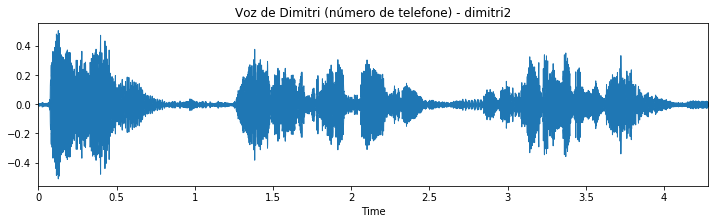

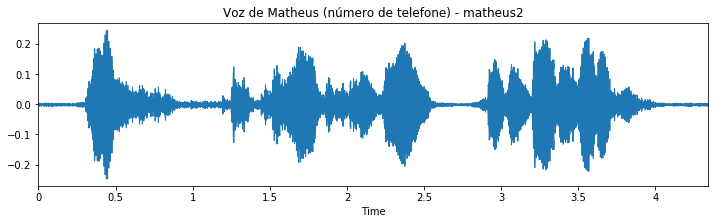

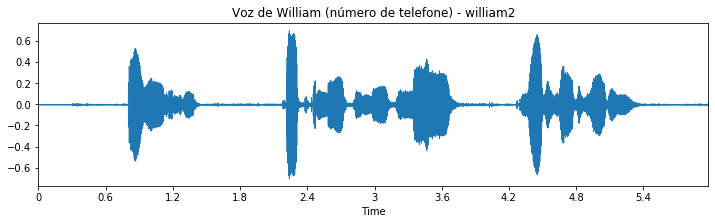

In [13]:
plotSinalTempo('Dimitri (número de telefone)', dimitri2[0], dimitri2[1], dimitri2[2])
plotSinalTempo('Matheus (número de telefone)', matheus2[0], matheus2[1], matheus2[2]) 
plotSinalTempo('William (número de telefone)', william2[0], william2[1], william2[2])

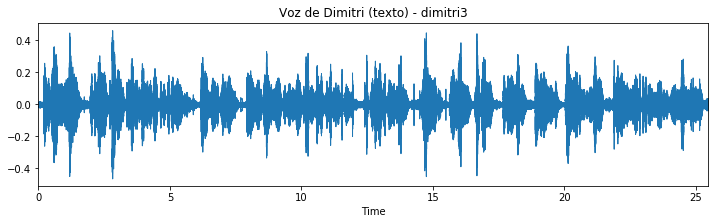

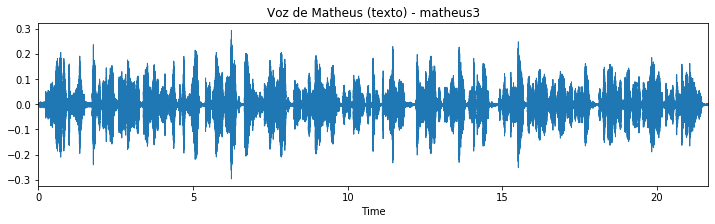

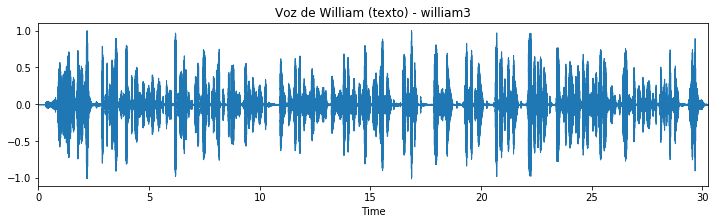

In [14]:
plotSinalTempo('Dimitri (texto)', dimitri3[0], dimitri3[1], dimitri3[2])
plotSinalTempo('Matheus (texto)', matheus3[0], matheus3[1], matheus3[2])
plotSinalTempo('William (texto)', william3[0], william3[1], william3[2])

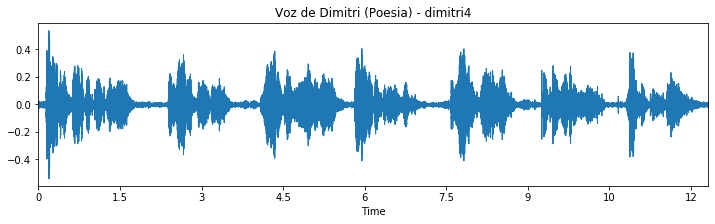

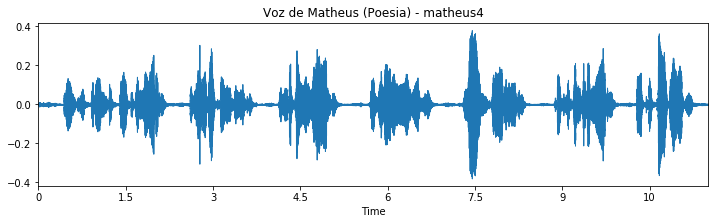

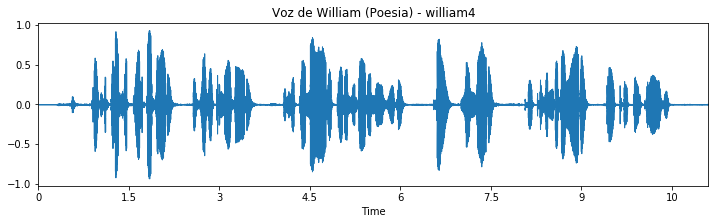

In [15]:
plotSinalTempo('Dimitri (Poesia)', dimitri4[0], dimitri4[1], dimitri4[2])
plotSinalTempo('Matheus (Poesia)', matheus4[0], matheus4[1], matheus4[2])
plotSinalTempo('William (Poesia)', william4[0], william4[1], william4[2])

### 2.1 Definição dos Parâmetros da Análise 

In [16]:
def parametros_analise(nome, v1, sr1):
    print(nome)
    print('Frequência de Amostragem:', sr1)

    Ts = 0.04   # Tempo de duração do segmento em segundos
    Nj = int(Ts*sr1) # Número de pontos da Janela
    print('Tamanho do Segmento:', Nj)

    Nseg = int(len(v1)/Nj)
    Nover = int(Nj*0.5)
    print(f'Número de Segmentos no Arquivo: {Nseg}\nPontos Soprepostos: {Nover}\n' )
    
    return Nj

In [17]:
Nj_texto = (parametros_analise('Dimitri - Texto', dimitri3[1], dimitri3[2]),
            parametros_analise('Matheus - Poema', matheus3[1], matheus3[2]),
            parametros_analise('William - Poema', william3[1], william3[2]))
Nj = Nj_texto[0]

Dimitri - Texto
Frequência de Amostragem: 22050
Tamanho do Segmento: 882
Número de Segmentos no Arquivo: 636
Pontos Soprepostos: 441

Matheus - Poema
Frequência de Amostragem: 22050
Tamanho do Segmento: 882
Número de Segmentos no Arquivo: 541
Pontos Soprepostos: 441

William - Poema
Frequência de Amostragem: 22050
Tamanho do Segmento: 882
Número de Segmentos no Arquivo: 756
Pontos Soprepostos: 441



In [18]:
Nj_texto

(882, 882, 882)

<h3> 2.2 Obtendo uma Janela de Hamming </h3>

Text(0.5, 1.0, 'Janela de Hamming')

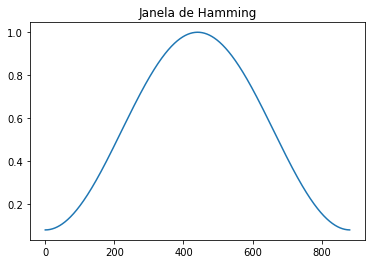

In [19]:
hm = signal.get_window('hamming', Nj)
plt.plot(hm); plt.title('Janela de Hamming')

<h2> 3. Energia de Tempo Curto </h2>

### 3.1 Cálculo para arquivo de teste 

In [20]:
def energia(nome, audio, v1, Nj):
    Nover = int(Nj*0.5)
    Nseg = int(len(v1)/Nj)
    E = []
    for l in range(1, Nseg):
        xjan = v1[(l-1)*Nj+Nover:l*Nj+Nover]*hm
        x2 = list(np.array(xjan**2))
        aux = sum(x2)/Nj
        E.append(aux)
    E = 10*np.log10(E)
    Emin = np.min(E)  # calcula nível de ruído de fundo
    plt.figure
    fig, ax = plt.subplots(figsize=(15, 3))
    plt.plot(E - Emin)
    plt.title('Energia da Voz - ' + str(audio))
    plt.ylabel('Energia[db]'); plt.xlabel('Segmento')

### 3.2 Agora leia os seus arquivos gravados e: 
**Determine o Contorno de Energia para três arquivos que vocês gravaram:** 
1. *dígitos*
2. *voz falada*
3. *voz declamada (poema)*


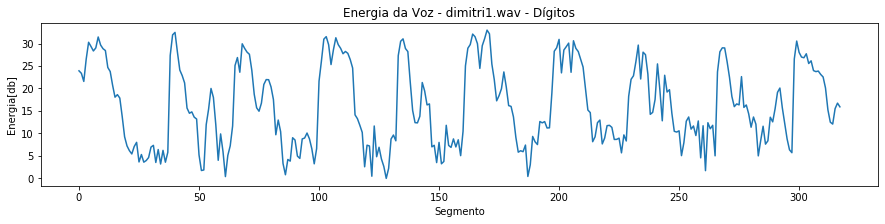

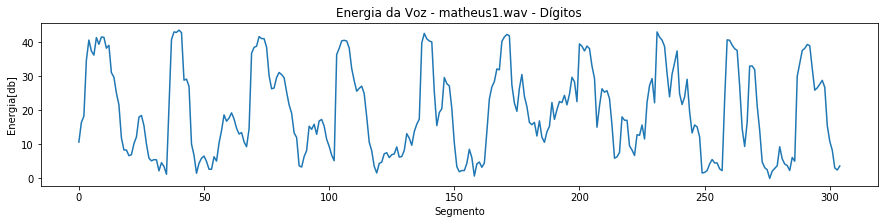

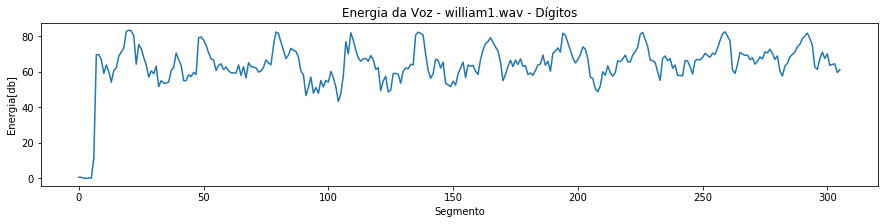

In [21]:
energia('Dimitri1', 'dimitri1.wav - Dígitos', dimitri1[1], Nj)
energia('Matheus1', 'matheus1.wav - Dígitos', matheus1[1], Nj)
energia('William1', 'william1.wav - Dígitos', william1[1], Nj)

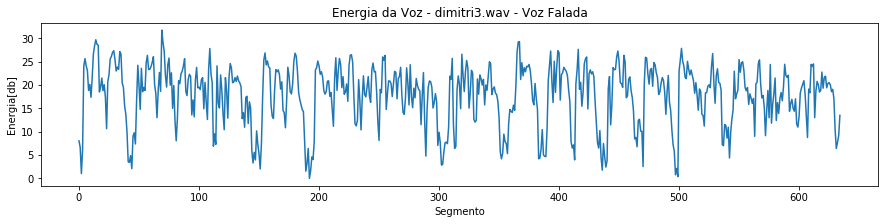

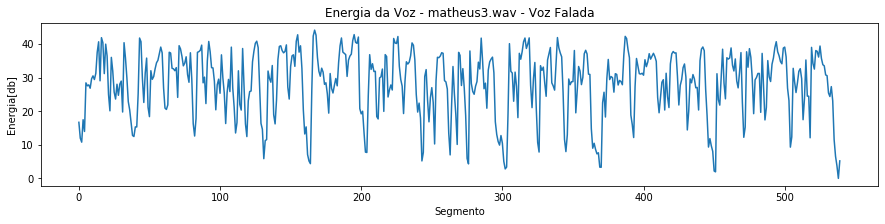

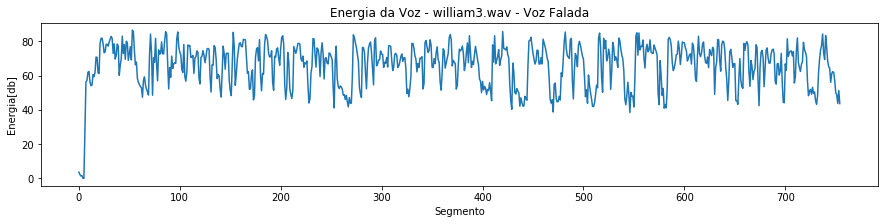

In [22]:
energia('Dimitri3', 'dimitri3.wav - Voz Falada', dimitri3[1], Nj)
energia('Matheus3', 'matheus3.wav - Voz Falada', matheus3[1], Nj)
energia('William3', 'william3.wav - Voz Falada', william3[1], Nj)

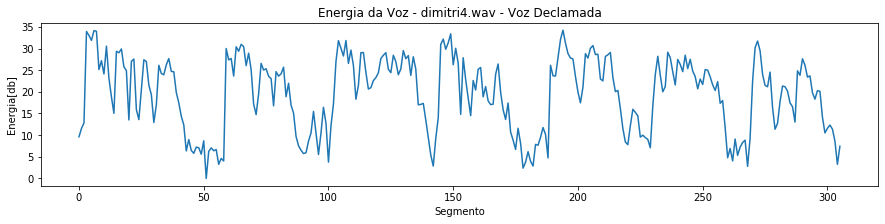

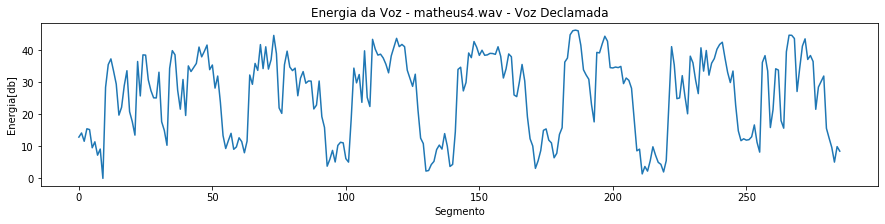

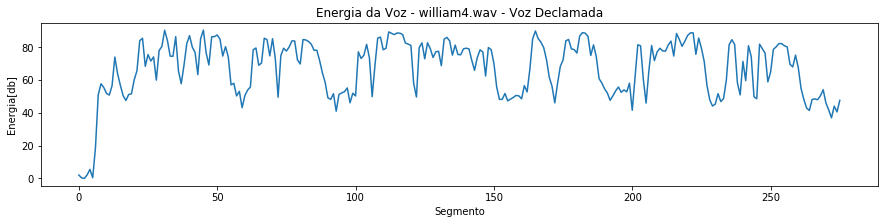

In [23]:
energia('Dimitri4', 'dimitri4.wav - Voz Declamada', dimitri4[1], Nj)
energia('Matheus4', 'matheus4.wav - Voz Declamada', matheus4[1], Nj)
energia('William4', 'william4.wav - Voz Declamada', william4[1], Nj)

<h2> 4. Espectrogramas </h2>

### 4.1 Visualização do Espectrograma para Arquivo de Teste

In [24]:
def potencia_espectro(audio, v1):
    #plt.figure(figsize=(12, 8))
    D = librosa.amplitude_to_db(np.abs(librosa.stft(v1)), ref=np.max)
    fig, ax = plt.subplots(figsize=(16, 4))
    librosa.display.specshow(D, x_axis='time',y_axis='linear')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Potência e Espectrograma Linear na Frequência - '+ str(audio))

### 4.2 Agora com os seus arquivos
**Faça os espectrogramas para os arquivos que vocês gravaram e calculem o contorno de energia:**
<ul>
<li> Dígitos </li>
<li> Texto Lido </li>
<li> Poesia </li>
</ul>

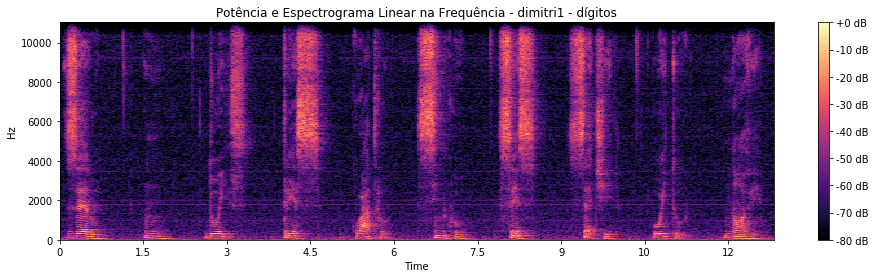

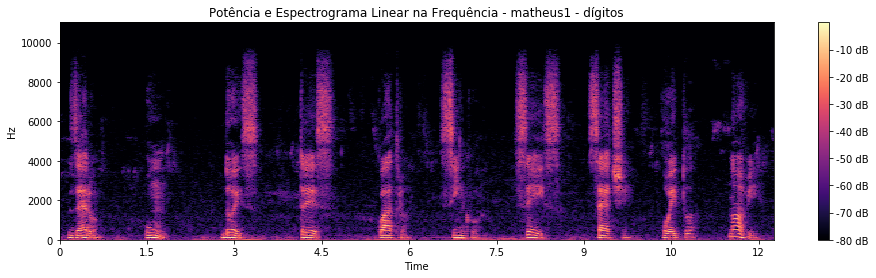

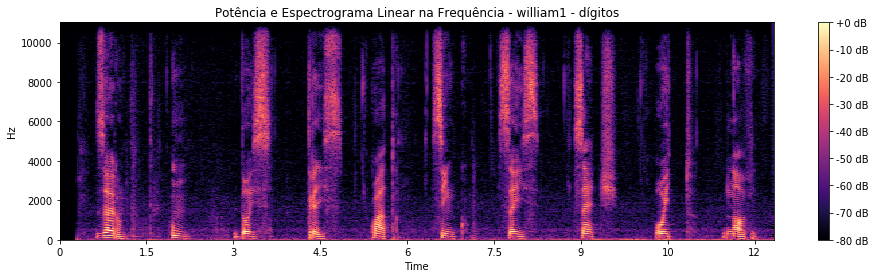

In [25]:
potencia_espectro(dimitri1[0]+' - dígitos', dimitri1[1])
potencia_espectro(matheus1[0]+' - dígitos', matheus1[1])
potencia_espectro(william1[0]+' - dígitos', william1[1])

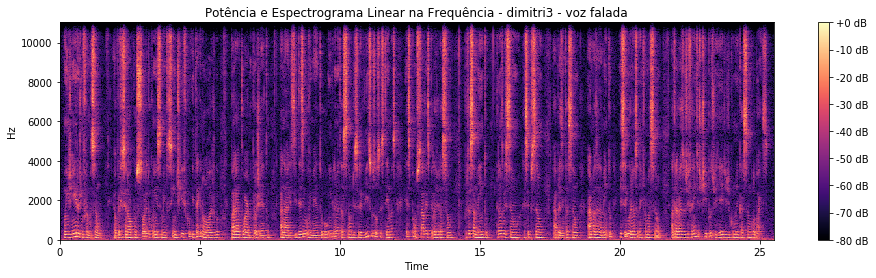

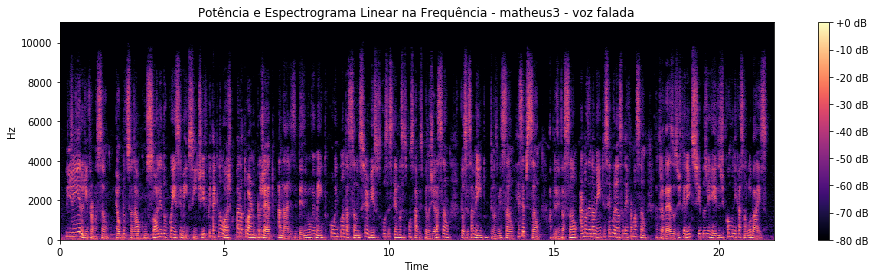

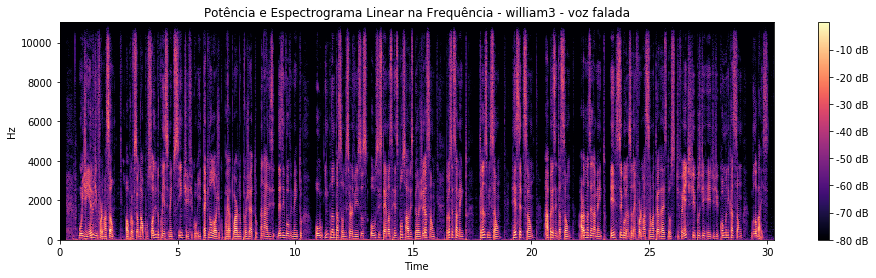

In [26]:
potencia_espectro(dimitri3[0]+' - voz falada', dimitri3[1])
potencia_espectro(matheus3[0]+' - voz falada', matheus3[1])
potencia_espectro(william3[0]+' - voz falada', william3[1])

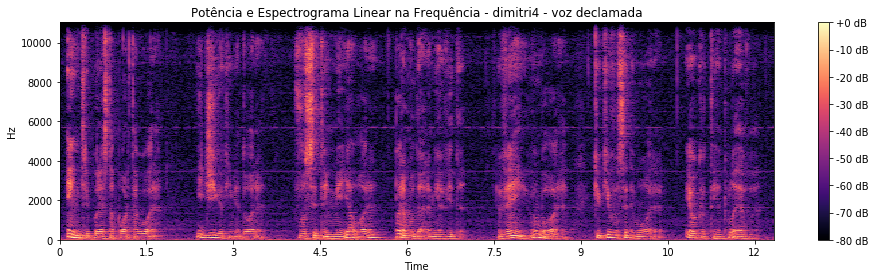

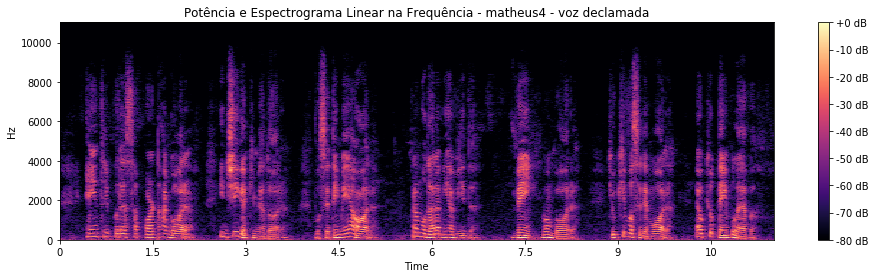

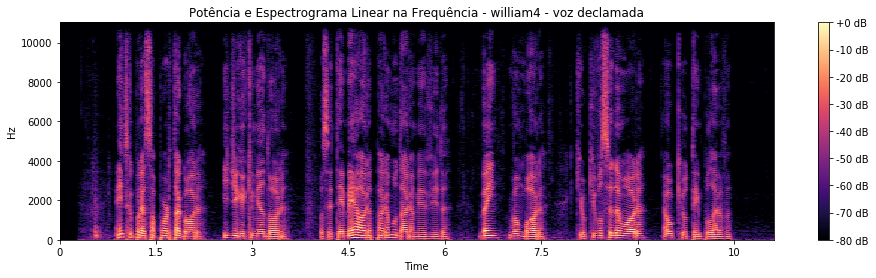

In [27]:
potencia_espectro(dimitri4[0]+' - voz declamada', dimitri4[1])
potencia_espectro(matheus4[0]+' - voz declamada', matheus4[1])
potencia_espectro(william4[0]+' - voz declamada', william4[1])

<h2> 5. Determinação do Pitch e da F0 </h2>

### O Período de Pitch ($T_{0}$) será o intervalo entre picos sucessivos. 
### A Frequência Fundamental ($f_0$) será o inverso do periódo de Pitch

Determine o Período de Pitch e a Fundamental desta vogal. 

## Agora com cada um dos seus arquivos: 
**Determine o Pitch e a $f_0$ das vogais que desejarem (três vogais diferentes) dos seus arquivos, para as versões:**
1. Dígitos
2. Falada
3. Declamada

In [28]:
def pitch(nome, fonema, v1En, sr1, distance):
    acEn = librosa.autocorrelate(v1En, max_size= sr1/32)
    fig, ax = plt.subplots(figsize=(15, 5))
    ax.xaxis.set_major_locator(MultipleLocator(1))
    y1 = acEn[1:400]
    x1 = range(len(y1))
    xx = [i*1000/sr1 for i in x1]
    plt.grid(True)
    ax.plot(xx,y1)

    peaks, _ = signal.find_peaks(y1, distance=distance)
    plt.plot(peaks*1000/sr1, y1[peaks], "x")
    T0 = np.diff(peaks*1000/sr1)[0]
    f0 = 1/T0 * 1000
    print(f'T0 = {T0} ms')
    print(f'f0 = {f0} Hz')

    plt.title(f'Auto-correlação - {nome} - /{fonema}/')
    plt.xlabel('tempo em [ms]')
    plt.show()

In [29]:
dimitri1_vogal = dimitri1[1][0:12000]
IPython.display.Audio(data=dimitri1_vogal, rate=sr1)

In [30]:
matheus1_vogal = matheus1[1][0:10000]
IPython.display.Audio(data=matheus1_vogal, rate=sr1)

In [31]:
william1_vogal = william1[1][12000:21000]
IPython.display.Audio(data=william1_vogal, rate=dimitri1[2])

T0 = 8.888888888888888 ms
f0 = 112.50000000000001 Hz


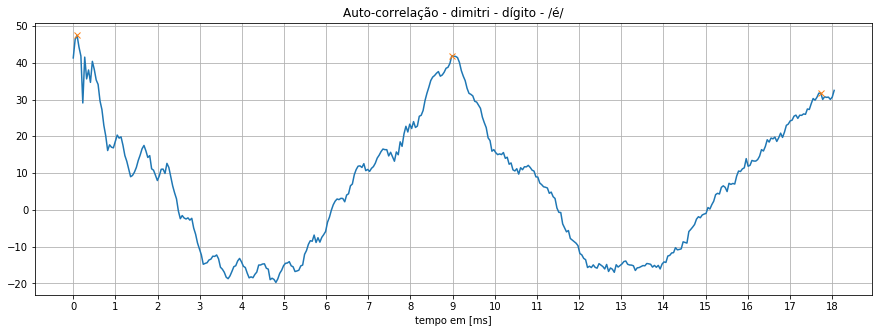

T0 = 6.802721088435374 ms
f0 = 147.00000000000003 Hz


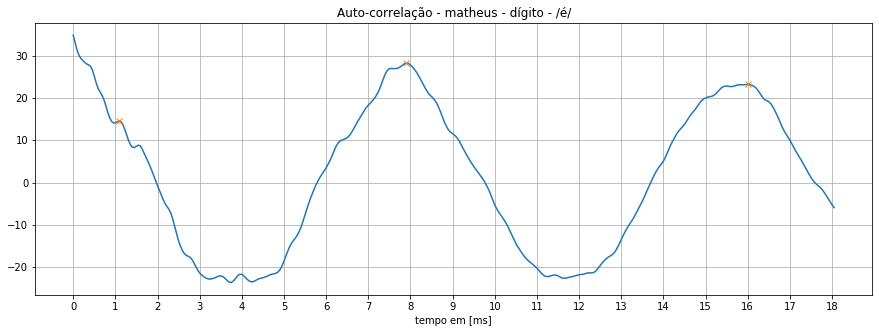

T0 = 5.941043083900227 ms
f0 = 168.3206106870229 Hz


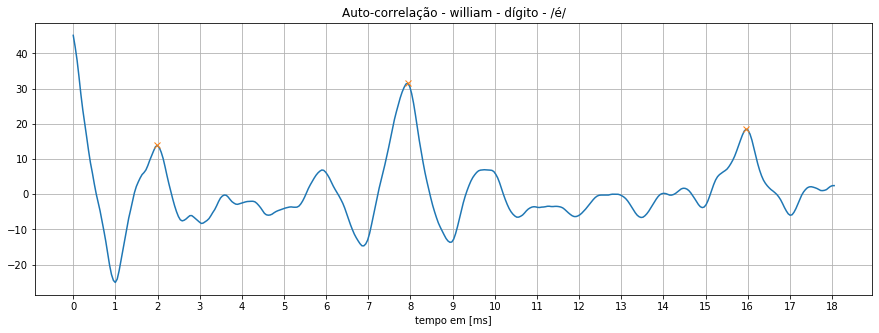

In [32]:
pitch('dimitri - dígito', 'é', dimitri1_vogal, sr1, 100)
pitch('matheus - dígito', 'é', matheus1_vogal, sr1, 100)
pitch('william - dígito', 'é', william1_vogal, sr1, 100)

In [33]:
dimitri3_vogal = dimitri3[1][17000:20000]
IPython.display.Audio(data=dimitri3_vogal, rate=sr1)

In [34]:
matheus3_vogal = matheus3[1][17000:21000]
IPython.display.Audio(data=matheus3_vogal, rate=sr1)

In [35]:
william3_vogal = william3[1][34000:38000]
IPython.display.Audio(data=william3_vogal, rate=sr1)

T0 = 6.213151927437642 ms
f0 = 160.94890510948903 Hz


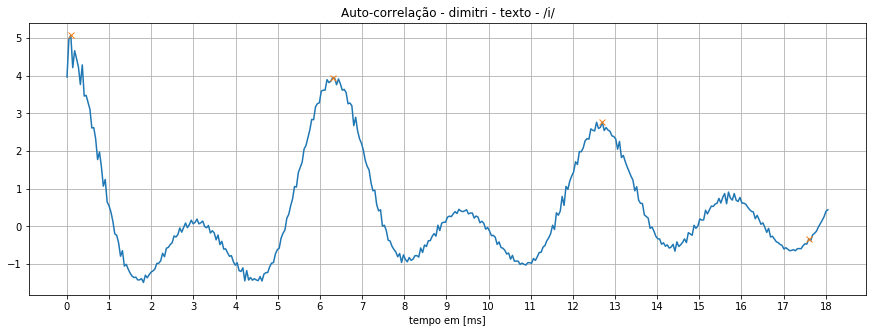

T0 = 8.571428571428571 ms
f0 = 116.66666666666667 Hz


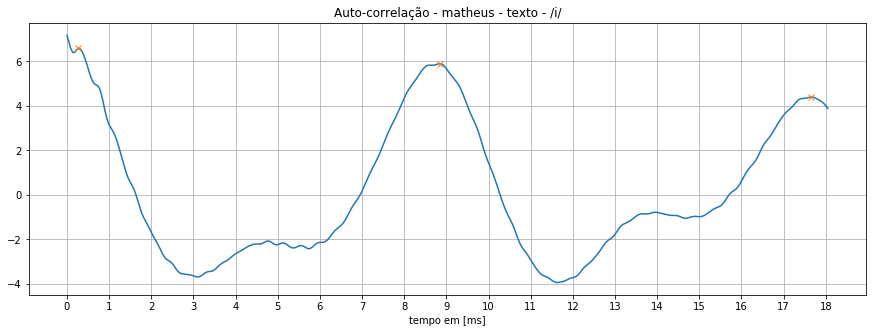

T0 = 8.52607709750567 ms
f0 = 117.28723404255318 Hz


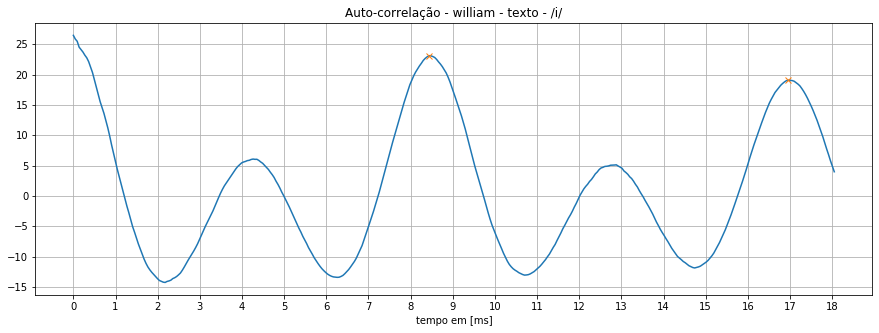

In [36]:
pitch('dimitri - texto', 'i', dimitri3_vogal, sr1, 100)
pitch('matheus - texto', 'i', matheus3_vogal, sr1, 100)
pitch('william - texto', 'i', william3_vogal, sr1, 100)

In [37]:
dimitri4_vogal = dimitri4[1][3000:8000]
IPython.display.Audio(data=dimitri4_vogal, rate=sr1)

In [38]:
matheus4_vogal = matheus4[1][9000:14000]
IPython.display.Audio(data=matheus4_vogal, rate=sr1)

In [39]:
william4_vogal = william4[1][20000:23000]
IPython.display.Audio(data=william4_vogal, rate=sr1)

T0 = 6.712018140589569 ms
f0 = 148.98648648648648 Hz


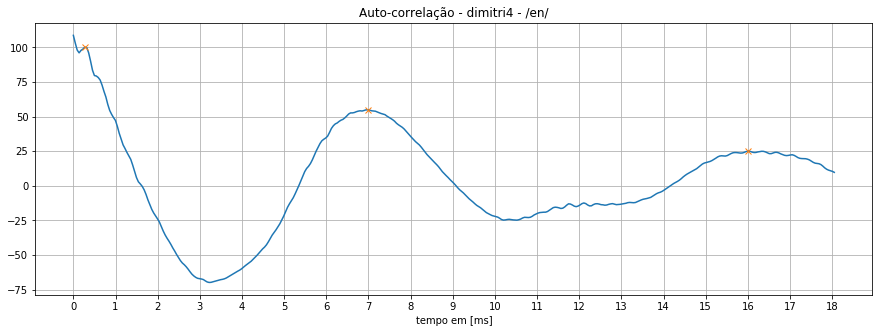

T0 = 5.07936507936508 ms
f0 = 196.87499999999997 Hz


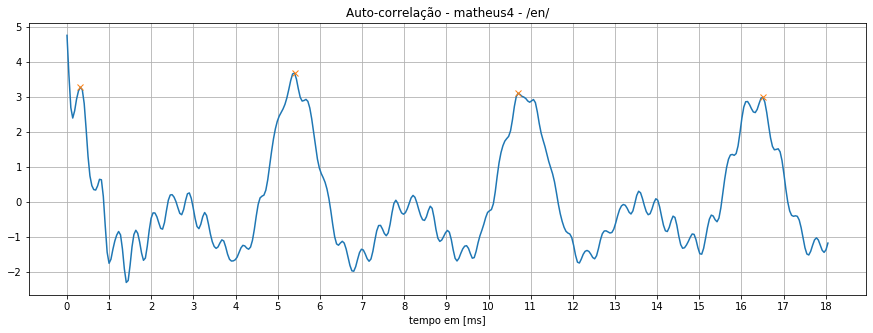

T0 = 5.895691609977324 ms
f0 = 169.6153846153846 Hz


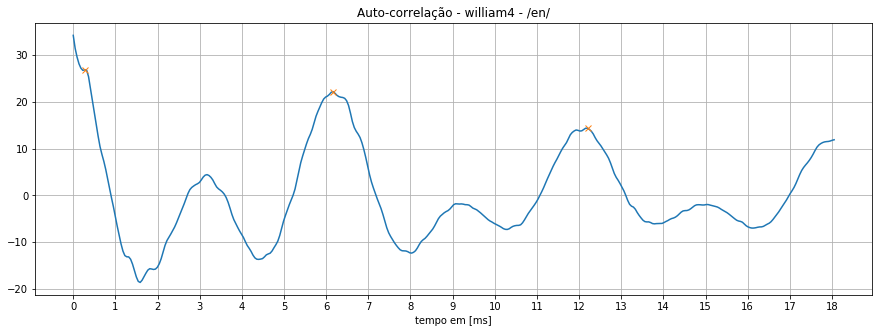

In [40]:
pitch('dimitri4', 'en', dimitri4_vogal, sr1, 100)
pitch('matheus4', 'en', matheus4_vogal, sr1, 100)
pitch('william4', 'en', william4_vogal, sr1, 100)

## 5.3 Determinação das Formantes 

#### 5.3.a Formantes do trecho de teste

In [41]:
def formantes(vogal, palavra, nome, v1En, sr1, xp, yp):
    # AUDIO DE "En" em v1En
    f, Pxx_spec = signal.periodogram(v1En, sr1, 'flattop', scaling='spectrum')
    lf = len(f)
    fig, AX = plt.subplots(figsize=(15, 5))
    AX.xaxis.set_major_locator(MultipleLocator(100))
    AX.plot(f[:int(lf/4)], 10*np.log10(np.sqrt(Pxx_spec[:int(lf/4)])))
    plt.xlabel('Frequência [Hz]')
    plt.ylabel('Log-spectro [dB]')
    plt.title(f'Espectro da Vogal /{vogal}/ de <{palavra}> de '+ str(nome))
    plt.grid(True)

    AX.scatter(xp,yp, s=200, color='r', marker='o')
    
    print(f'f1: {xp[0]} Hz')
    print(f'f2: {xp[1]} Hz')
    print(f'f3: {xp[2]} Hz')
    print(f'f4: {xp[3]} Hz')
    
    plt.show()

#### 5.3.b Os quatro primeros picos no espectro são as formantes $f_1$ a $f_4$
### 5.4 Agora com seus arquivos
Determine as formantes das vogais dos arquivos que vocês calcularam os espectrogramas

f1: 105 Hz
f2: 215 Hz
f3: 340 Hz
f4: 465 Hz


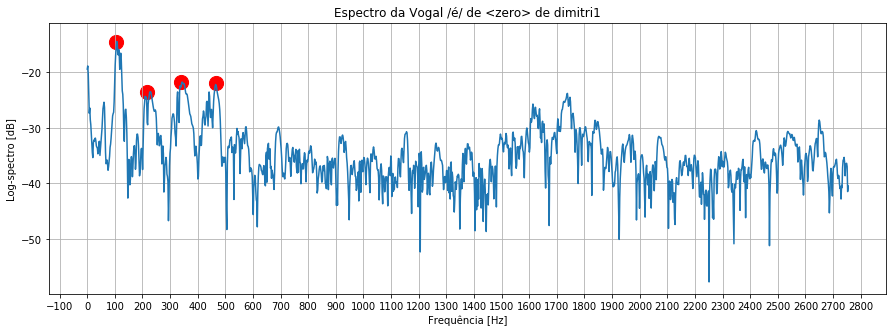

f1: 119 Hz
f2: 250 Hz
f3: 360 Hz
f4: 490 Hz


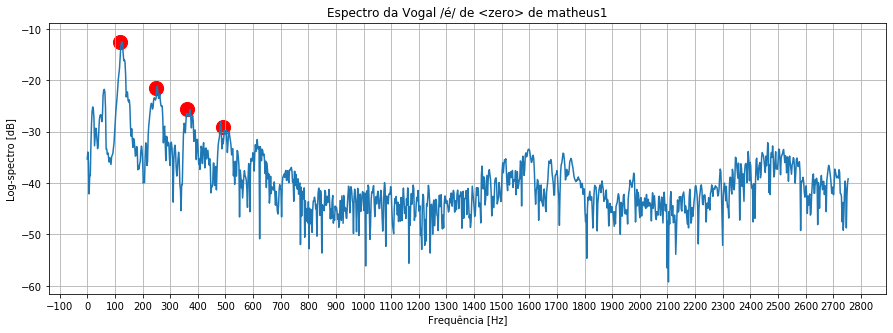

f1: 115 Hz
f2: 255 Hz
f3: 390 Hz
f4: 520 Hz


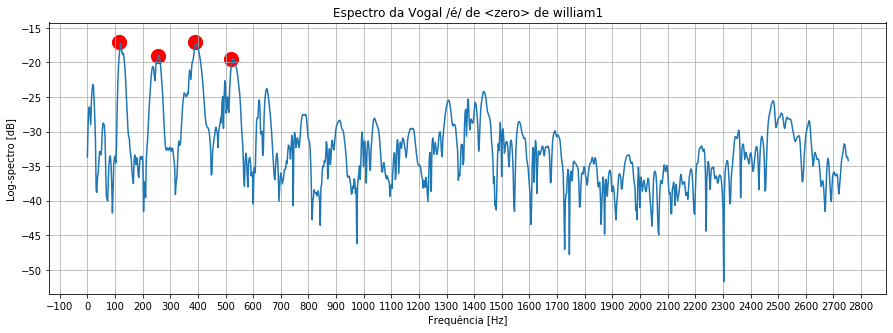

In [43]:
formantes('é', 'zero', dimitri1[0], dimitri1_vogal, sr1, [105,215,340,465], [-14.5,-23.5,-21.7,-21.9])
formantes('é', 'zero', matheus1[0], matheus1_vogal, sr1, [119,250,360,490], [-12.5,-21.5,-25.5,-29])
formantes('é', 'zero', william1[0], william1_vogal, sr1, [115,255,390,520], [-17,-19,-17,-19.5])

f1: 130 Hz
f2: 295 Hz
f3: 450 Hz
f4: 625 Hz


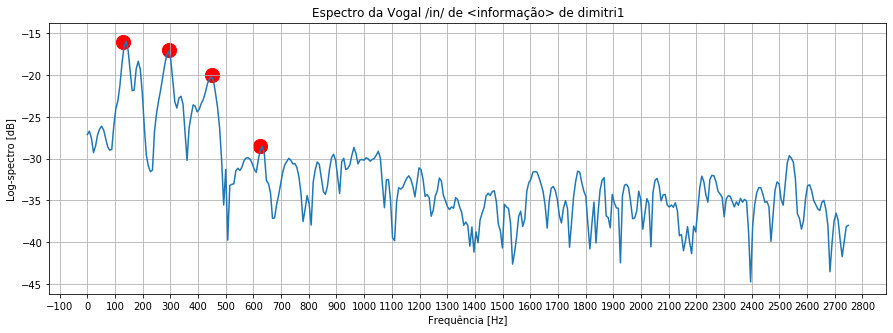

f1: 105 Hz
f2: 215 Hz
f3: 425 Hz
f4: 650 Hz


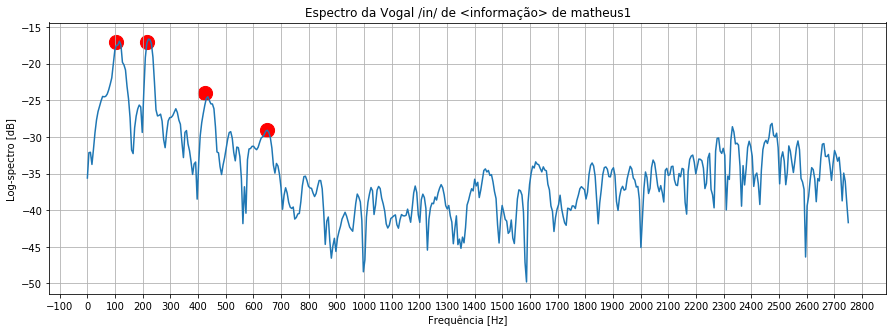

f1: 230 Hz
f2: 350 Hz
f3: 490 Hz
f4: 550 Hz


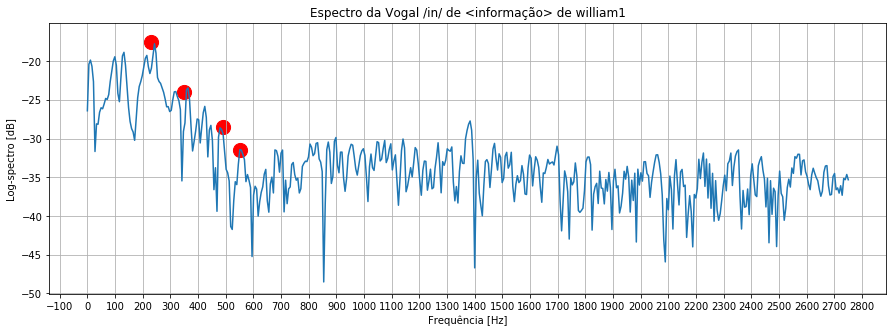

In [44]:
formantes('in', 'informação', dimitri1[0], dimitri3_vogal, sr1, [130,295,450,625], [-16,-17,-20,-28.5])
formantes('in', 'informação', matheus1[0], matheus3_vogal, sr1, [105,215,425,650], [-17,-17,-24,-29])
formantes('in', 'informação', william1[0], william3_vogal, sr1, [230,350,490,550], [-17.5,-24,-28.5,-31.5])

f1: 130 Hz
f2: 275 Hz
f3: 430 Hz
f4: 540 Hz


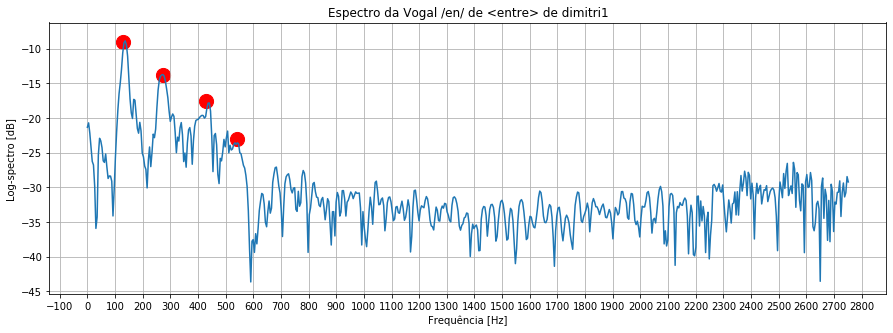

f1: 180 Hz
f2: 360 Hz
f3: 540 Hz
f4: 720 Hz


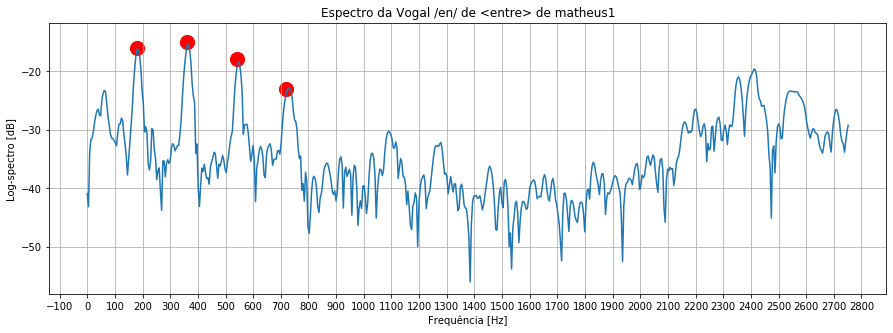

f1: 160 Hz
f2: 330 Hz
f3: 500 Hz
f4: 680 Hz


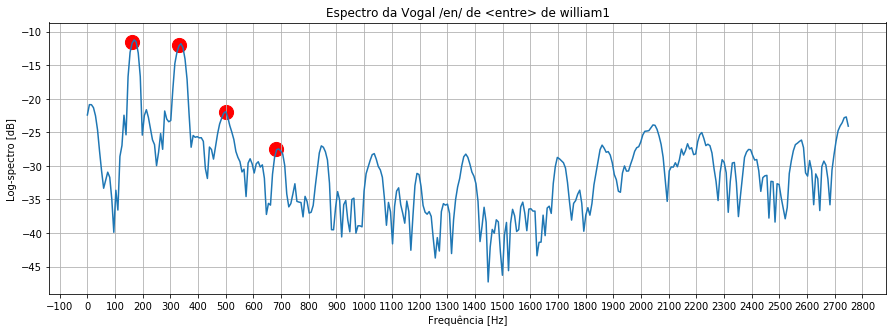

In [45]:
formantes('en', 'entre', dimitri1[0], dimitri4_vogal, sr1, [130,275,430,540], [-9,-13.8,-17.5,-23])
formantes('en', 'entre', matheus1[0], matheus4_vogal, sr1, [180,360,540,720], [-16,-15,-18,-23])
formantes('en', 'entre', william1[0], william4_vogal, sr1, [160,330,500,680], [-11.5,-12,-22,-27.5])

## 6. Determinação de Consoantes e Plosivos

Usando alguns de seus arquivos, no espectrograma, determine algumas consoantes surdas (p.ex. /s/ e /f/), surdas plosivas (p.ex. /p/, /t/ ou /k/) e sonoras (p.ex. (/b/, /v/, /g/, /m/, /nh/ e /lh/). Destaque circundando-as no espectrograma.

In [46]:
#dimitri1_esp = dimitri1[1][18000:110000]
dimitri1_esp = dimitri1[1][0:170000]
IPython.display.Audio(data=dimitri1_esp, rate=sr1)

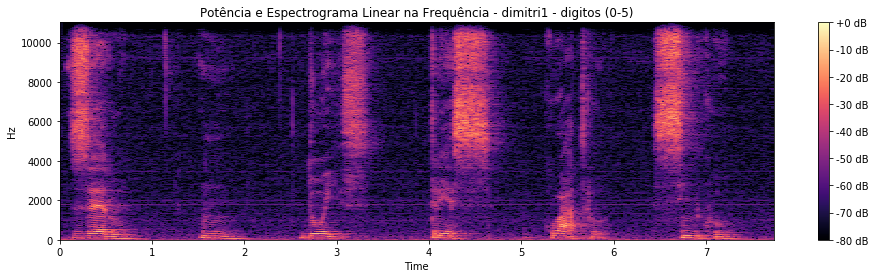

In [47]:
potencia_espectro(dimitri1[0]+' - digitos (0-5)', dimitri1_esp)

In [48]:
matheus1_esp = matheus1[1][0:170000]
IPython.display.Audio(data=matheus1_esp, rate=sr1)

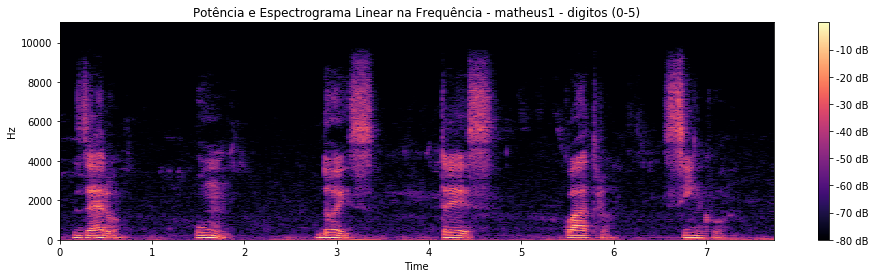

In [49]:
potencia_espectro(matheus1[0]+' - digitos (0-5)', matheus1_esp)

In [50]:
william1_esp = william1[1][0:160000]
IPython.display.Audio(data=william1_esp, rate=sr1)

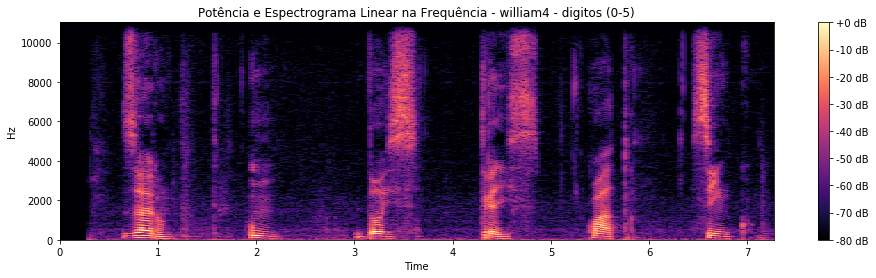

In [51]:
potencia_espectro(william4[0]+' - digitos (0-5)', william1_esp)

# 7. RELATÓRIO

* A áudio descrição pode ser mais simplificada, pois neste Lab são muitos os arquivos de áudio.  
* Na página do Laboratório (LEMBREM-SE que os notebooks são ANEXOS, e não páginas html), incluir os arquivos de voz de cada um dos integrantes.
*   Fazer uma tabela com todos os valores de pitch e $f_0$ de todos os integrantes, de acordo com o item 5.2., e comparem-nas.
* Escolher um conjunto de formantes ($f_1$ a $f_4$) de cada integrante, para a mesma vogal, e comparem-nas.
* Fazer uma seção de **Comentários e Conclusões** incluindo a análise dos espectrogramas das consoantes.

